<table align="left">
  <td>
    <a href="https://colab.research.google.com/github/marco-canas/algebra/blob/main/classes/ciencia_datos/1_class/1_class.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>
  </td>
</table>

## [Descripción de la lista de repreducción de apoyo al aprendizaje]()

* la tuplas en python
* cómo definir funciones
* La documentación de las funciones en Python 
* el módulo pyplot de la librería matplitlib
* el módulo animation de la librería matplotlib


# [Class 1. Differential Calculus. A. Geron](https://github.com/ageron/handson-ml2/blob/master/math_differential_calculus.ipynb)

## Slope of a straight line

In [1]:
#@title

import matplotlib as mpl # librería para visualización científica
import matplotlib.pyplot as plt # 
import numpy as np # librería para obtener funciones matemáticas 
#import matplotlib.plotly as plotly
# To get smooth animations
import matplotlib.animation as animation
mpl.rc('animation', html='jshtml')

In [3]:
#@title
import numpy as np 
import matplotlib as mpl
from matplotlib import pyplot as plt 

def get_AB_line(A_pos, B_pos, x_min=-1000, x_max=+1000):
    """
    INPUT: A_pos and B_pos are nbarray row - vector. 
    OUTPUT: two list of python con las abscisas y las ordenadas de dos puntos de una recta. 
    """
    rise = B_pos[1] - A_pos[1]
    run = B_pos[0] - A_pos[0]
    slope = rise / run
    offset = A_pos[1] - slope * A_pos[0] # Intersepto en el origen b
    return [x_min, x_max], [x_min * slope + offset, x_max * slope + offset]

In [ ]:
def plot_AB_line(A_pos, B_pos, A_name="A", B_name="B"):
    """
    INPUT: 
    OUTPUT: 
    """
    for point, name in ((A_pos, A_name), (B_pos, B_name)):
        plt.plot(point[0], point[1], "bo")
        plt.text(point[0] - 0.35, point[1], name, fontsize=14)
    xs, ys = get_AB_line(A_pos, B_pos)
    plt.plot(xs, ys)

In [ ]:
def plot_rise_over_run(A_pos, B_pos):
    '''
    INPUT: 
    OUTPUT: 
    '''
    plt.plot([A_pos[0], B_pos[0]], [A_pos[1], A_pos[1]], "k--")
    plt.text((A_pos[0] + B_pos[0]) / 2, A_pos[1] - 0.4, "run", fontsize=14)
    plt.plot([B_pos[0], B_pos[0]], [A_pos[1], B_pos[1]], "k--")
    plt.text(B_pos[0] + 0.2, (A_pos[1] + B_pos[1]) / 2, "rise", fontsize=14)

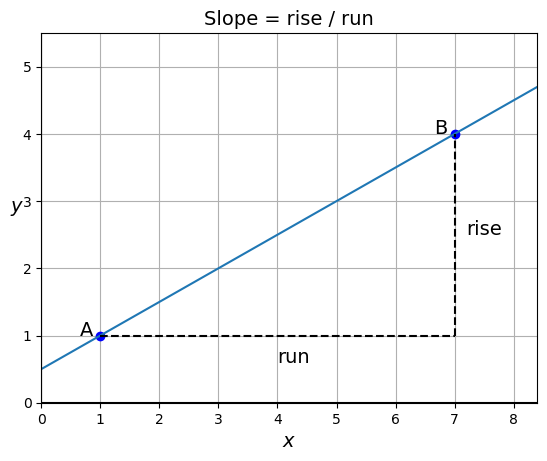

In [4]:
def show(axis="equal", ax=None, title=None, xlabel="$x$", ylabel="$y$"):
    ax = ax or plt.gca()
    ax.axis(axis)
    ax.grid()
    ax.set_title(title, fontsize=14)
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14, rotation=0)
    ax.axhline(y=0, color='k')
    ax.axvline(x=0, color='k')

A_pos = np.array([1, 1])
B_pos = np.array([7, 4])
plot_AB_line(A_pos, B_pos)
plot_rise_over_run(A_pos, B_pos)
show([0, 8.4, 0, 5.5], title="Slope = rise / run")

As you probably know, the slope of a (non-vertical) straight line can be calculated by taking any two points $\mathrm{A}$ and $\mathrm{B}$ on the line, and computing the "rise over run":

$slope = \dfrac{rise}{run} = \dfrac{\Delta y}{\Delta x} = \dfrac{y_\mathrm{B} - y_\mathrm{A}}{x_\mathrm{B} - x_\mathrm{A}}$  

In this example, the rise is 3, and the run is 6, so the slope is $3/6 = 0.5$.

# Defining the slope of a curve

But what if you want to know the slope of something else than a straight line?   

For example, let's consider the curve defined by $y = f(x) = x^{2}$:

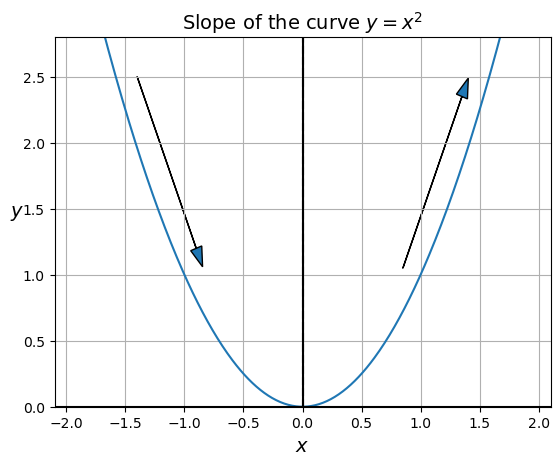

In [5]:
#@title
xs = np.linspace(-2.1, 2.1, 500) # obtención de una progresión aritmética de inicio en -2.1, de último término (2.1 - (-2.1))/500
ys = xs**2
plt.plot(xs, ys)

plt.plot([0, 0], [0, 3], "k--")
plt.arrow(-1.4, 2.5, 0.5, -1.3, head_width=0.1)
plt.arrow(0.85, 1.05, 0.5, 1.3, head_width=0.1)
show([-2.1, 2.1, 0, 2.8], title="Slope of the curve $y = x^2$")

plt.savefig('pendiente_de_x_2.jpg')

plt.show()

* Obviously, the slope varies: on the left (i.e., when $x<0$), the slope is negative (i.e., when we move from left to right, the curve goes down),   

* while on the right (i.e., when $x>0$) the slope is positive (i.e., when we move from left to right, the curve goes up). 

At the point $x=0$, the slope is equal to 0 (i.e., the curve is locally flat). 

The fact that the slope is 0 when we reach a minimum (or indeed a maximum) is crucially important, and we will come back to it later.

How can we put numbers on these intuitions? 

Well, say we want to estimate the slope of the curve at a point $\mathrm{A}$, we can do this by taking another point $\mathrm{B}$ on the curve, not too far away, and then computing the slope between these two points:

In [6]:
#@title

import numpy as np 
import matplotlib as mlp
from matplotlib import pyplot as plt 

def animate_AB_line(f, fp, f_str, x_A, axis=None):
    """
    INPUT:
    OUTPUT: 
    
    """
    y_A = f(x_A)
    eps = 1e-4
    x_B_range = 1.5
    x_B = x_A + eps

    n_frames = 200
    text_offset_A = -0.2
    text_offset_B = +0.1
    x_min, x_max = -1000, 1000

    fig, ax = plt.subplots()

    # plot f(x)
    xs = np.linspace(-2.1, 2.1, 500)
    ys = f(xs)
    ax.plot(xs, ys)

    # plot the tangent to the curve at point A
    if fp:
        slope = fp(x_A)
        offset = y_A - slope * x_A
        ax.plot([x_min, x_max], [slope*x_min + offset, slope*x_max + offset],
                "y--")

    # plot the line AB and the labels A and B so they can be animated
    y_A = f(x_A)
    y_B = f(x_B)
    xs, ys = get_AB_line([x_A, y_A], [x_B, y_B])
    line_inf, = ax.plot(xs, ys, "-")
    line_AB, = ax.plot([x_A, x_B], [y_A, y_B], "bo-")
    ax.text(x_A + text_offset_A, y_A, "A", fontsize=14)
    B_text = ax.text(x_B + text_offset_B, y_B, "B", fontsize=14)

    # plot the grid and axis labels
    title = r"Slope of the curve $y = {}$ at $x_\mathrm{{A}} = {}$".format(f_str, x_A)
    show(axis or [-2.1, 2.1, 0, 2.8], title=title)

    def update_graph(i):
        x_B = x_A + x_B_range * np.cos(i * 2 * np.pi / n_frames) ** 3
        if np.abs(x_B - x_A) < eps:
            x_B = x_A + eps # to avoid division by 0
        y_B = f(x_B)
        xs, ys = get_AB_line([x_A, y_A], [x_B, y_B])
        line_inf.set_data(xs, ys)
        line_AB.set_data([x_A, x_B], [y_A, y_B])
        B_text.set_position([x_B + text_offset_B, y_B])
        return line_inf, line_AB

    anim = animation.FuncAnimation(fig, update_graph,
                                  init_func=lambda: update_graph(0),
                                  frames=n_frames,
                                  interval=20,
                                  blit=True)
    plt.close()
    return anim

animate_AB_line(lambda x: x**2, lambda x: 2*x, "x^2", -1)

## Once Loop Reflect

As you can see, when point $B$ is very close to point $A$, $(AB)$ the line becomes almost indistinguishable from the curve itself (at least locally around point $A$). The $(AB)$ line gets closer and closer to the **tangent** line to the curve at point $A$: this is the best linear approximation of the curve at point $A$.

So it makes sense to define the slope of the curve at point $A$ as the slope that the $(AB)$ line approaches when $B$ gets infinitely close to $A$. 

This slope is called the **derivative** of the function $f$ at $x = x_{A}$. 

For example, the derivative of the function $f(x) = x^{2}$ at $x = x_{A}$ is equal to $2x_{A}$ (we will see how to get this result shortly), so on the graph above, since the point $A$ is located at $x_{A} = -1$, the tangent line to the curve at that point  has a slope of $-2$.

# [Differentiability según Geron](https://github.com/ageron/handson-ml2/blob/master/math_differential_calculus.ipynb)

Note that some functions are not quite as well-behaved as $x^{2}$: for example, consider the function $f(x) = |x|$, the absolute value of $x$:

In [7]:
#@title
animate_AB_line(lambda x: np.abs(x), None, "|x|", 0)

# Once Loop Reflect

No matter how much you zoom in on the origin (the point at $x = 0$, $y = 0$), the curve will always look like a V. 

The slope is $-1$ for any $x < 0$, and it is $+1$ for any $x > 0$, but at $x = 0$, **the slope is undefined**, since it is not possible to approximate the curve $y = |x|$ locally around the origin using a straight line, no matter how much you zoom in on that point.

The function $f(x) = |x|$ is said to be **non-differentiable** at $x = 0$: its derivative is undefined at $x = 0$. This means that the curve $y = |x|$ has an undefined slope at that point. 

However, the function $f(x) = |x|$ is differentiable at all other points.

#  Presaberes

* ¿Qué es una función?

es una maquina. Ejemplo: y = 2x = f(x)

## Representar a las funciones de manera tabular 

|x|y|
|-|-|
|1|800|  
|2|1600|
|3|2400| 

Esta es la representación tabular de una función: La función que para el n´mero de huevos nos entrega el valor a pagar. 

## Representación bidimensional o en plano cartesiano de la función

Text(0, 0.5, 'el valor de los huevos')

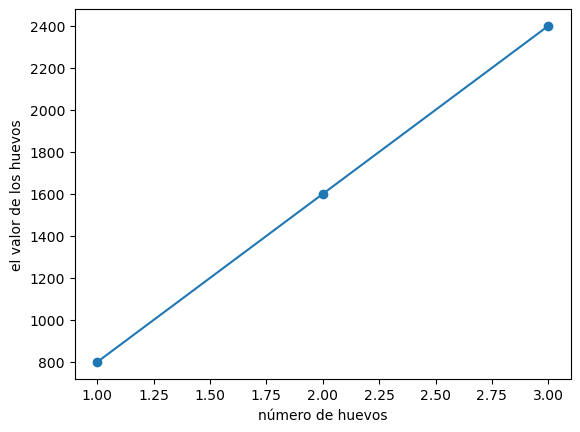

In [3]:
import matplotlib.pyplot as plt 

lo_que_entra=[1,2,3]
lo_que_sale=[800,1600,2400]

plt.scatter(lo_que_entra,lo_que_sale)

plt.plot(lo_que_entra,lo_que_sale)

plt.xlabel('número de huevos')
plt.ylabel('el valor de los huevos')

## Interpretaciones del gráfico

1. La relación entre número de huevos y precio de los mismos es creciente y lineal.
2. a mas huevos compramos, mas es el valor a pagar. 

# Límites y sus propiedades. Página 60 Larson. 

El límite de una función es el concepto principal que distingue al cálculo del álgebra y de la geometría analítica. 

La noción de un límite es fundamental para el estudio del cálculo. 

De esta manera, es importante adquirir un buen concepto de límite antes de incursionar en otros tópicos de cálculo.

En este capítulo, se aprenderá:  

* Cómo comparar el cálculo con el precálculo. (1.1)  
* Cómo encontrar límites gráfica y numéricamente. (1.2)  
* Cómo evaluar de forma analítica un límite. (1.3)  
* Cómo determinar la continuidad en un punto y sobre un intervalo abierto, y cómo determinar límites laterales. (1.4)  
* Cómo determinar límites infinitos y cómo encontrar las asíntotas verticales. (1.5)

De acuerdo con la NASA, el lugar más frío del universo está en la nébula de Boomerang. La nébula se localiza a cinco mil años luz de la Tierra y tiene una temperatura de $-272°C$. Esta temperatura es únicamente 1° más caliente que el cero absoluto, la temperatura más fría posible. ¿Cómo determinaron los científicos que el cero absoluto es el “límite inferior” de la temperatura de la materia? (Ver la sección 1.4, ejemplo 5.)


El proceso de un límite es un concepto fundamental del cálculo. Una técnica que se puede utilizar para estimar un límite consiste en trazar la función y luego determinar el comportamiento de la gráfica a medida que la variable independiente se aproxima a un valor específico. (Ver la sección 1.2.)

# 1.2 Cálculo de límites de manera gráfica y numérica (Según Larson. Página 67) 

* Estimar un límite utilizando los métodos numérico y gráfico.  
* Aprender diferentes formas en las que un límite puede no existir.
* Estudiar y utilizar la definición formal de límite.

## Introducción a los límites

Suponer que se pide dibujar la gráfica de la función f dada por

$$ f(x) = \frac{x^{3} - 1}{x - 1}, \ \ \ x \neq 1 $$


## Representación gráfica de $f$

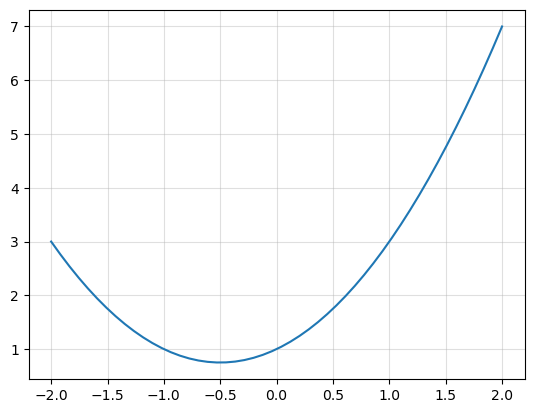

In [14]:
import numpy as np 
import matplotlib.pyplot as plt 

def f(x):
    if x != 1:
        f = (x**3-1)/(x-1)
        return f
    elif x == 1:
        print(r'$f$ no está definida en $x = 1$')

dominio = np.linspace(-2,2)
rango = np.array([f(x) for x in dominio]) 

plt.plot(dominio, rango) 
plt.grid(alpha = 0.4)


plt.show() 


# 1.2 Ejercicios (Página 73 del Larson)  

En los ejercicios 1 a 8,   
* completar la tabla y utilizar el resultado para estimar el límite.   
* Representar la función utilizando una herramienta de graficación como Matplotlib, con el fin de confirmar su resultado.


## Vocabulary

* far away: lejos.  
* forge rise: forjar aumento.  
* smooth animation: animación suave.   
* once: una vez
* not trusted: no es de confianza.
* overwhelm: abrumar.
* submit: enviar, presentar. 
* chatGPT is at capacity right now: esta lleno en este momento.  
* x greater than zero: x > 0
* x less than zero: 



## Ejercicios de tarea recomendados para fijación del conocimiento
### Límites de funciones matemáticas (Página 107 del Larson)



## Asignación aleatoria de tres ejercicios para realizar cuaderno con estructura

* Nombre del estudiante  
* Ejercicios resueltos graficamente
* Ejercicios resueltos algebraicamente
* ejercicios resueltos utilizando la representación tabular. 

# Apendice I: Chat GPT3 from openAI  

ChatGPT: Optimizing Language Models for Dialogue

We’ve trained a model called ChatGPT which interacts in a conversational way. 

The dialogue format makes it possible for ChatGPT to answer followup questions, admit its mistakes, challenge incorrect premises, and reject inappropriate requests. 

ChatGPT is a sibling model to InstructGPT, which is trained to follow an instruction in a prompt and provide a detailed response.

## Methods

We trained this model using Reinforcement Learning from Human Feedback (RLHF), using the same methods as InstructGPT, but with slight differences in the data collection setup. We trained an initial model using supervised fine-tuning: human AI trainers provided conversations in which they played both sides—the user and an AI assistant. We gave the trainers access to model-written suggestions to help them compose their responses. We mixed this new dialogue dataset with the InstructGPT dataset, which we transformed into a dialogue format.

To create a reward model for reinforcement learning, we needed to collect comparison data, which consisted of two or more model responses ranked by quality. To collect this data, we took conversations that AI trainers had with the chatbot. We randomly selected a model-written message, sampled several alternative completions, and had AI trainers rank them. Using these reward models, we can fine-tune the model using Proximal Policy Optimization. We performed several iterations of this process.

ChatGPT is fine-tuned from a model in the GPT-3.5 series, which finished training in early 2022. 

You can learn more about the 3.5 series here. ChatGPT and GPT 3.5 were trained on an Azure AI supercomputing infrastructure.

## Limitations

ChatGPT sometimes writes plausible-sounding but incorrect or nonsensical answers. Fixing this issue is challenging, as: (1) during RL training, there’s currently no source of truth; (2) training the model to be more cautious causes it to decline questions that it can answer correctly; and (3) supervised training misleads the model because the ideal answer depends on what the model knows, rather than what the human demonstrator knows.

ChatGPT is sensitive to tweaks to the input phrasing or attempting the same prompt multiple times. For example, given one phrasing of a question, the model can claim to not know the answer, but given a slight rephrase, can answer correctly.

    The model is often excessively verbose and overuses certain phrases, such as restating that it’s a language model trained by OpenAI. These issues arise from biases in the training data (trainers prefer longer answers that look more comprehensive) and well-known over-optimization issues.12
    Ideally, the model would ask clarifying questions when the user provided an ambiguous query. Instead, our current models usually guess what the user intended.
    While we’ve made efforts to make the model refuse inappropriate requests, it will sometimes respond to harmful instructions or exhibit biased behavior. We’re using the Moderation API to warn or block certain types of unsafe content, but we expect it to have some false negatives and positives for now. We’re eager to collect user feedback to aid our ongoing work to improve this system.

Iterative deployment

Today’s research release of ChatGPT is the latest step in OpenAI’s iterative deployment of increasingly safe and useful AI systems. Many lessons from deployment of earlier models like GPT-3 and Codex have informed the safety mitigations in place for this release, including substantial reductions in harmful and untruthful outputs achieved by the use of reinforcement learning from human feedback (RLHF).
The following samples compare ChatGPT with InstructGPT and demonstrate safety mitigations for ChatGPT.

## Tareas para fijar conceptos y para adquirir habilidades 

## Evaluacion (Ejercicios tipo parcial o tipo quiz)

## Referentes  

* Geron, A. Math - Differential Calculus: https://github.com/ageron/handson-ml2/blob/master/math_differential_calculus.ipynb

* Larson 

* chat GPT from openAI: https://openai.com/blog/chatgpt/

* Getting Started with Plotly in Python : https://plotly.com/python/getting-started/

# [Apéndice sobre Plotly](https://plotly.com/python/getting-started/) 

## Como Instalar Plotly

In [2]:
# conda install -c plotly plotly=5.11.0 